## Google Research - Identify Contrails to Reduce Global Warming

### Import modules

In [1]:
# basic modules
import pandas as pd
import numpy as np
import datetime
import os
from tqdm import tqdm

import random

# Visualization
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython import display

# pytorch modules
import torch
from torch.utils.data import Dataset, DataLoader
from torch.nn import BCELoss, Sigmoid
from torch.optim import Adam
from torch.optim.lr_scheduler import ReduceLROnPlateau 
from torchvision.transforms import Normalize
from torch.multiprocessing import Pool
import torch.nn as nn
from collections import OrderedDict
from torch.optim import lr_scheduler

In [2]:
base_dir = "/kaggle/input/google-research-identify-contrails-reduce-global-warming/"
train_path = os.path.join(base_dir,"train")
test_path = os.path.join(base_dir,"test")
val_path = os.path.join(base_dir,"validation")

train_ids = os.listdir(train_path)
#train_ids = np.loadtxt("/kaggle/input/train-ids-existcontrail/train_ids_ExistContrail.csv", delimiter=",", dtype = "unicode")
#train_ids = train_ids.tolist()

test_ids = os.listdir(test_path)
val_ids = os.listdir(val_path)

### Combine bands into a false color image (ASH Transform)

[In order to view contrails in GOES, we use the "ash" color scheme. This color scheme was originally developed for viewing volcanic ash in the atmosphere but is also useful for viewing thin cirrus, including contrails. In this color scheme, contrails appear in the image as dark blue.](https://www.kaggle.com/code/inversion/visualizing-contrails)

- `Input` = np.ndarray of shape `(Bands=3, Time_frame=8, H=256, W=256)` where Bands corresponds to bands `[11, 14, 15]`.
- `Output` = np.ndarray of shape `(Time_frame=8, Channel=3, H=256, W=256)` where Channel corresponds to rgb colorscheme.

In [3]:
def ash_transform(x, time_frame:int=4):
    _T11_BOUNDS = (243, 303)
    _CLOUD_TOP_TDIFF_BOUNDS = (-4, 5)
    _TDIFF_BOUNDS = (-4, 2)
    if time_frame is not None:
        x = x[:,time_frame,:,:]
    def normalize_range(data, bounds):
        """Maps data to the range [0, 1]."""
        return (data - bounds[0]) / (bounds[1] - bounds[0])

    r = normalize_range(x[2] - x[1], _TDIFF_BOUNDS)
    g = normalize_range(x[1] - x[0], _CLOUD_TOP_TDIFF_BOUNDS)
    b = normalize_range(x[1], _T11_BOUNDS)
    
    return np.clip(np.stack([r, g, b], axis=-3), 0, 1) # (T,3,H,W) or (3,H,W)

Augmentation (by GPT)

In [4]:

def random_horizontal_flip(video):
    if random.random() < 0.5:
        return video[..., ::-1]
    return video

def random_vertical_flip(video):
    if random.random() < 0.5:
        return video[..., ::-1, :]
    return video

def random_mask(img, mask_size=10, musk_num=20):
    i = 0
    for i in range(musk_num):
        if random.random() < 0.5:
            h, w = img.shape[-2:]
            top = random.randint(0, h - mask_size)
            left = random.randint(0, w - mask_size)
            img[..., top:top+mask_size, left:left+mask_size] = 0
            i += 1
    return img

def augment_video(video):
    #video = random_vertical_flip(video)  #正解データも反転させないとダメでは？
    #print(video.shape)
    video = np.stack([random_mask(frame) for frame in video.transpose(1, 0, 2, 3)])

    return video.transpose(1, 0, 2, 3)


# Test with dummy data
#video = np.random.rand(3, 10, 224, 224)
#augmented_video = augment_video(video)


### CustomDataset and DataLoader

- `ids` = record ids
- `base_dir` = path to parent(train/val/test) dir
- `bands` = list of integers corresponding bands(band_xx.npy). Default:loads all bands 
- `transforms` = list of function applied to np.ndarray of shape `(Band, Time_frame, H, W)`
- `Output` = torch.tensor, dtype = `torch.float32`

In [5]:
class ContrailDataset(Dataset):
    def __init__(self, ids, base_dir, bands=None, transforms:list=[], test_mode:bool=False, aug=False):
        self.ids = ids
        self.base_dir = base_dir
        self.transforms = transforms
        self.bands = bands
        self.permute = (2,0,1)
        self.test_mode = test_mode
        self.aug = aug
        
    def __getitem__(self, index):
        record_id = self.ids[index]
        
        if self.bands is None:
            band_list = [f'band_{band:02d}.npy' for band in range(8,17)]
        else :
            band_list = [f'band_{int(band):02d}.npy' for band in self.bands]
        
        x = list()
        for band in band_list:
            x_path = os.path.join(self.base_dir, record_id, band)
            x.append(np.load(x_path).transpose(self.permute))

        x = np.stack(x,axis=1) ## X.shape = (Time_frame,channel,H,W)
        
        x = x.transpose((1,0,2,3)) ## PLUS ## X.shape = (channel, Time_frame ,H,W)
        
        #print(x.shape)
        
        if self.aug:
            #print(x.shape)
            x = augment_video(x)
            #x = random_mask(x)
        
        
        for transformation in self.transforms:
            x = transformation(x)
            

        
        x = torch.from_numpy(x.astype(np.float32))
        
        if self.test_mode:
            return x
        else:
            y_path = os.path.join(self.base_dir, record_id,'human_pixel_masks.npy')
            y = torch.from_numpy(np.load(y_path).transpose(self.permute).astype(np.float32))

            return x, y

    def __len__(self):
        return len(self.ids)
        
    

### Initiate Dataset and DataLoader

In [6]:
# Datasets 
dataset_params = {
    "bands" : [11,14,15], 
    "transforms" : [ash_transform]
}
train_dataset = ContrailDataset(train_ids, train_path, **dataset_params, aug=True)
test_dataset = ContrailDataset(test_ids, test_path, test_mode=True, **dataset_params)
val_dataset = ContrailDataset(val_ids, val_path, **dataset_params)

# DalaLoaders
dataloader_params = {
    "batch_size" : 16,
    "shuffle" : True,
    "num_workers": 4,
    "drop_last": True
#     "pin_memory": True

}
train_loader = DataLoader(train_dataset, **dataloader_params)
test_loader = DataLoader(test_dataset, shuffle=False, batch_size=2)
val_loader = DataLoader(val_dataset, **dataloader_params)

/opt/conda/lib/python3.10/site-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


### Visualization

In [7]:
def plot_contrail(x, y, time_frame = 4):
    '''
    x = false color img of shape (8, 3, H, W)
    y = contrail mask of shape (1, H, W)
    time_frame = int, default = 4
    '''
    if x.ndim == 4:
        x = x[time_frame]
    
    plt.figure(figsize=(18, 6))
    ax = plt.subplot(1, 3, 1)
    ax.imshow(x.permute(1,2,0))
    ax.set_title('False color image')

    ax = plt.subplot(1, 3, 2)
    ax.imshow(y.permute(1,2,0), interpolation='none')
    ax.set_title('Ground truth contrail mask')

    ax = plt.subplot(1, 3, 3)
    ax.imshow(x.permute(1,2,0))
    ax.imshow(y.permute(1,2,0), cmap='Reds', alpha=.4, interpolation='none')
    ax.set_title('Contrail mask on false color image');

    plt.show()

def plot_contrail_comparision(x, y_true, y_pred, time_frame = 4):
    '''
    x = false color img of shape (3, H, W) or (8, 3, H, W)
    y_true = target contrail mask of shape (1, H, W)
    y_pred = predicted contrail mask of shape (1, H, W)
    time_frame = int, default = 4
    '''
    if x.ndim == 4:
        x = x[time_frame]
    
    plt.figure(figsize=(18, 6))
    ax = plt.subplot(1, 5, 1)
    ax.imshow(x.permute(1,2,0))
    ax.set_title('False color image(x)')
    ax.axis('off')
    
    ax = plt.subplot(1, 5, 2)
    ax.imshow(y_true.permute(1,2,0), interpolation='none')
    ax.set_title('True contrail mask(y_true)')
    ax.axis('off')
    
    ax = plt.subplot(1, 5, 3)
    ax.imshow(x.permute(1,2,0))
    ax.imshow(y_true.permute(1,2,0), cmap='Reds', alpha=.4, interpolation='none')
    ax.set_title('y_true mask on x')
    ax.axis('off')
    
    ax = plt.subplot(1, 5, 4)
    ax.imshow(y_pred.permute(1,2,0), interpolation='none')
    ax.set_title('Pred contrail mask(y_pred)')
    ax.axis('off')

    ax = plt.subplot(1, 5, 5)
    ax.imshow(x.permute(1,2,0))
    ax.imshow(y_pred.permute(1,2,0), cmap='Reds', alpha=.4, interpolation='none')
    ax.set_title('y_pred mask on x')
    ax.axis('off')
    
    plt.show()

def animate_contrail(x):
    '''
    x = false color img of shape (8, 3, H, W)
    '''
    if x.ndim !=4:
        print(f"Incorrect input dimensions, Expected 4 recievied {x.ndim}.")
        return
    # Animation
    fig = plt.figure(figsize=(4, 4))
    im = plt.imshow(x[0].permute(1,2,0))
    def draw(i):
        im.set_array(x[i].permute(1,2,0))
        return [im]
    anim = animation.FuncAnimation(
        fig, draw, frames=x.shape[0], interval=100, blit=True
    )
    plt.close()
    return display.HTML(anim.to_jshtml())

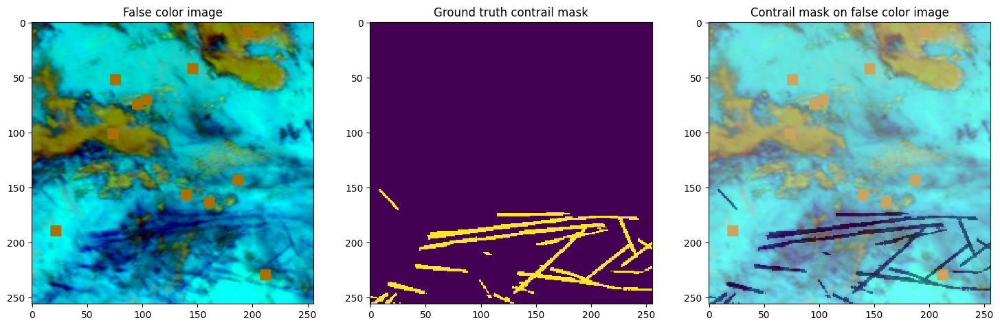

Incorrect input dimensions, Expected 4 recievied 3.


In [8]:
 x, y = train_dataset[train_ids.index('1704010292581573769')]
 plot_contrail(x, y)
 animate_contrail(x)

### Essential functions
- Dice coefficient
- Callbacks to track loss and other params
- Callbacks to save best state

In [9]:
# Dice Coefficient
def dice_coeff(mask1, mask2):
    intersect = torch.sum(mask1 * mask2)
    m1sum = torch.sum(mask1)
    m2sum = torch.sum(mask2)
    dice = (2 * intersect ) / (m1sum + m2sum)
    return dice.item()

# # Example
# mask1 = torch.randint(0,2,(10, 256,256))
# mask2 = torch.randint(0,2,(10, 256,256))
# print(dice_coeff(mask1, mask2))

In [10]:
# Callbacks
class History:
    def __init__(self, print_prefix, save_to_disk=True):
        self.train_batch_history = []
        self.val_batch_histroy = []
        self.train_epoch_history = []
        self.val_epoch_history = []
        self.running_train_batch_history = []
        self.running_val_batch_history = []
        self.print_prefix = print_prefix
        self.save_to_disk = save_to_disk
        if save_to_disk:
            self.save_path = os.path.join(os.getcwd(),"saved_states",self.print_prefix)
            if not os.path.exists(self.save_path):
                os.makedirs(self.save_path)
    def on_train_batch_end(self, data):
        self.running_train_batch_history.append(data)
        
    def on_val_batch_end(self, data):
        self.running_val_batch_history.append(data)
        
    def on_epoch_end(self):
        self.train_epoch_history.append(np.mean(self.running_train_batch_history))
        self.train_batch_history.extend(self.running_train_batch_history)
        self.running_train_batch_history=[]
        self.val_epoch_history.append(np.mean(self.running_val_batch_history))
        self.val_batch_histroy.extend(self.running_val_batch_history)
        self.running_val_batch_history=[]
        print(f"{self.print_prefix}: Train = {self.train_epoch_history[-1]:.6f} \
        | Val = {self.val_epoch_history[-1]:.6f}")
    
    def on_end(self):
        if self.save_to_disk:
            #dt = datetime.datetime.now().strftime("%Y-%m-%d_%H:%M:%S")
            np.save(os.path.join(self.save_path,"train_batch.npy"),self.train_batch_history)
            np.save(os.path.join(self.save_path,"val_batch.npy"),self.val_batch_histroy)
            np.save(os.path.join(self.save_path,"train_epoch.npy"),self.train_epoch_history)
            np.save(os.path.join(self.save_path,"val_epoch.npy"),self.val_epoch_history)

In [11]:
class BestStateTracker:
    def __init__(self, model, optim, trigger:History, save_to_disk:bool = False):
        self.trigger = trigger
        self.model = model
        self.optim = optim
        self.optim_state = None
        self.model_state = None
        self.best_loss = np.inf
        self.save_to_disk = save_to_disk
        if save_to_disk:
            self.save_path = os.path.join(os.getcwd(),"saved_states")
            if not os.path.exists(self.save_path):
                os.mkdir(self.save_path)
                
    def on_epoch_end(self):
        if self.trigger.val_epoch_history[-1] < self.best_loss:
            self.model_state = self.model.state_dict()
            self.optim_state = self.optim.state_dict()
            
    def on_end(self):
        if self.save_to_disk:
            #dt = datetime.datetime.now().strftime("%Y-%m-%d_%H:%M:%S")
            torch.save(self.model_state,os.path.join(self.save_path,f"model_state_end.pt"))
            torch.save(self.optim_state,os.path.join(self.save_path,f"optim_state_end.pt"))

### Model Architecture

In [12]:
# Config
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
LR = 1e-2
EPOCHS = 25

In [13]:
class ASPP(nn.Module):
    def __init__(self, in_channels, out_channels, dilations):
        super(ASPP, self).__init__()
        self.aspp_blocks = nn.ModuleList()
        for dilation in dilations:
            self.aspp_blocks.append(
                nn.Sequential(
                    nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=dilation, dilation=dilation, bias=False),
                    nn.BatchNorm2d(out_channels),
                    nn.ReLU(inplace=True))
                )

    def forward(self, x):
        return sum(block(x) for block in self.aspp_blocks)


In [14]:
class UNet(nn.Module):

    def __init__(self, in_channels=3, out_channels=1, init_features=32):
        super(UNet, self).__init__()

        features = init_features
        self.encoder1 = UNet._block(in_channels, features, name="enc1")
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.encoder2 = UNet._block(features, features * 2, name="enc2")
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.encoder3 = UNet._block(features * 2, features * 4, name="enc3")
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.encoder4 = UNet._block(features * 4, features * 8, name="enc4")
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.bottleneck = ASPP(features * 8, features * 16, dilations=[1, 6, 12, 18])

        self.upconv4 = nn.ConvTranspose2d(
            features * 16, features * 8, kernel_size=2, stride=2
        )
        self.decoder4 = UNet._block((features * 8) * 2, features * 8, name="dec4")
        self.upconv3 = nn.ConvTranspose2d(
            features * 8, features * 4, kernel_size=2, stride=2
        )
        self.decoder3 = UNet._block((features * 4) * 2, features * 4, name="dec3")
        self.upconv2 = nn.ConvTranspose2d(
            features * 4, features * 2, kernel_size=2, stride=2
        )
        self.decoder2 = UNet._block((features * 2) * 2, features * 2, name="dec2")
        self.upconv1 = nn.ConvTranspose2d(
            features * 2, features, kernel_size=2, stride=2
        )
        self.decoder1 = UNet._block(features * 2, features, name="dec1")

        self.conv = nn.Conv2d(
            in_channels=features, out_channels=out_channels, kernel_size=1
        )

    def forward(self, x):
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(self.pool1(enc1))
        enc3 = self.encoder3(self.pool2(enc2))
        enc4 = self.encoder4(self.pool3(enc3))

        bottleneck = self.bottleneck(self.pool4(enc4))

        dec4 = self.upconv4(bottleneck)
        dec4 = torch.cat((dec4, enc4), dim=1)
        dec4 = self.decoder4(dec4)
        dec3 = self.upconv3(dec4)
        dec3 = torch.cat((dec3, enc3), dim=1)
        dec3 = self.decoder3(dec3)
        dec2 = self.upconv2(dec3)
        dec2 = torch.cat((dec2, enc2), dim=1)
        dec2 = self.decoder2(dec2)
        dec1 = self.upconv1(dec2)
        dec1 = torch.cat((dec1, enc1), dim=1)
        dec1 = self.decoder1(dec1)
        return torch.sigmoid(self.conv(dec1))

    @staticmethod
    def _block(in_channels, features, name, dropout_rate=0.25):
        return nn.Sequential(
            OrderedDict(
                [
                    (
                        name + "conv1",
                        nn.Conv2d(
                            in_channels=in_channels,
                            out_channels=features,
                            kernel_size=3,
                            padding=1,
                            bias=False,
                        ),
                    ),
                    (name + "norm1", nn.BatchNorm2d(num_features=features)),
                    (name + "relu1", nn.ReLU(inplace=True)),
                    (name + "dropout1", nn.Dropout(dropout_rate)),   # Dropout layer added
                    (
                        name + "conv2",
                        nn.Conv2d(
                            in_channels=features,
                            out_channels=features,
                            kernel_size=3,
                            padding=1,
                            bias=False,
                        ),
                    ),
                    (name + "norm2", nn.BatchNorm2d(num_features=features)),
                    (name + "relu2", nn.ReLU(inplace=True)),
                    (name + "dropout2", nn.Dropout(dropout_rate)),  # Dropout layer added
                ]
            )
        )


In [15]:
class Focal_MultiLabel_Loss(nn.Module):
    def __init__(self, gamma):
      super(Focal_MultiLabel_Loss, self).__init__()
      self.gamma = gamma
      self.bceloss = nn.BCELoss(reduction='none')

    def forward(self, outputs, targets): 
      bce = self.bceloss(outputs, targets)
      bce_exp = torch.exp(-bce)
      focal_loss = (1-bce_exp)**self.gamma * bce
      return focal_loss.mean()

In [16]:
model = UNet().to(DEVICE)

'''model = torch.hub.load('mateuszbuda/brain-segmentation-pytorch', 'unet',
                       in_channels=3, out_channels=1, init_features=32, 
                       pretrained=False).to(DEVICE)'''
optimizer = Adam(params=model.parameters(), lr=LR)

#loss_fn = BCELoss()
loss_fn = Focal_MultiLabel_Loss(gamma=2) 


#scheduler = ReduceLROnPlateau(optimizer)
scheduler = lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS)
loss_tracker = History(print_prefix="Loss")
dice_tracker = History(print_prefix="Dice")
save_state = BestStateTracker(model,optimizer,loss_tracker,save_to_disk=True)

### Model Train

  0%|          | 0/25 [00:00<?, ?it/s]


EPOCH: 1/25
Epoch: 1, Learning rate: 0.01


Train Batch: 1283/1283     | Loss: 0.009417:   0%|          | 0/25 [10:43<?, ?it/s]

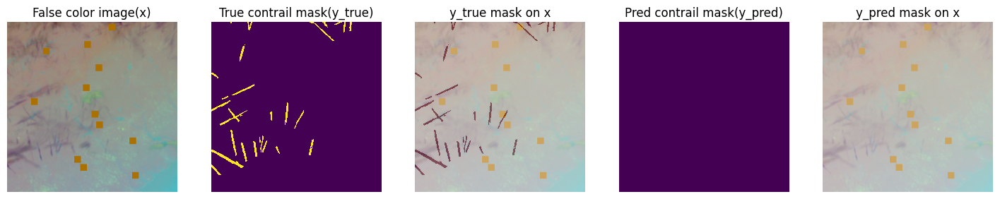

Val Batch:   116/116         | Loss: 0.003851:   0%|          | 0/25 [11:39<?, ?it/s]

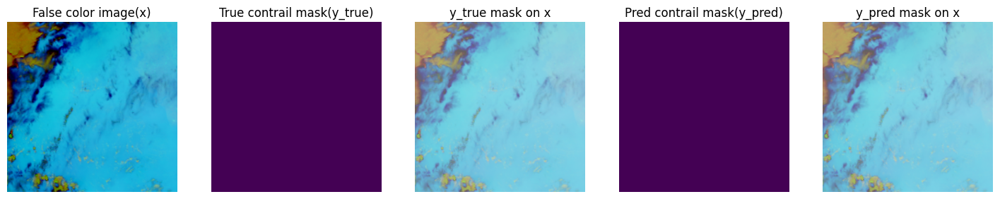

Val Batch:   116/116         | Loss: 0.003851:   4%|▍         | 1/25 [11:40<4:40:01, 700.06s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.009706         | Val = 0.003258
Dice: Train = 0.000066         | Val = 0.000000

EPOCH: 2/25
Epoch: 2, Learning rate: 0.00996057350657239


Train Batch: 1283/1283     | Loss: 0.006158:   4%|▍         | 1/25 [22:06<4:40:01, 700.06s/it]

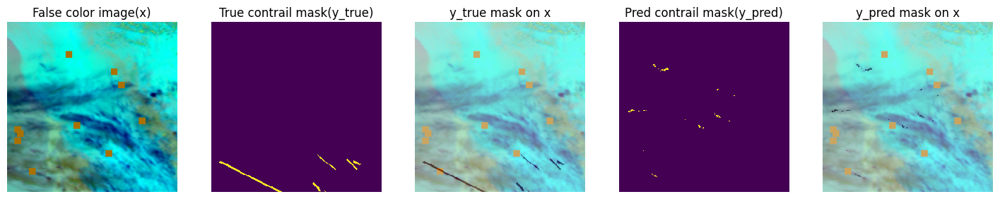

Val Batch:   116/116         | Loss: 0.003537:   4%|▍         | 1/25 [22:55<4:40:01, 700.06s/it]

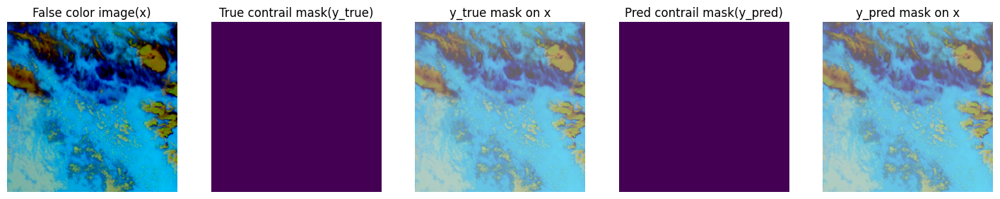

Val Batch:   116/116         | Loss: 0.003537:   8%|▊         | 2/25 [22:55<4:22:53, 685.82s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.005759         | Val = 0.002581
Dice: Train = 0.043287         | Val = 0.048625

EPOCH: 3/25
Epoch: 3, Learning rate: 0.009842915805643155


Train Batch: 1283/1283     | Loss: 0.009121:   8%|▊         | 2/25 [33:27<4:22:53, 685.82s/it]

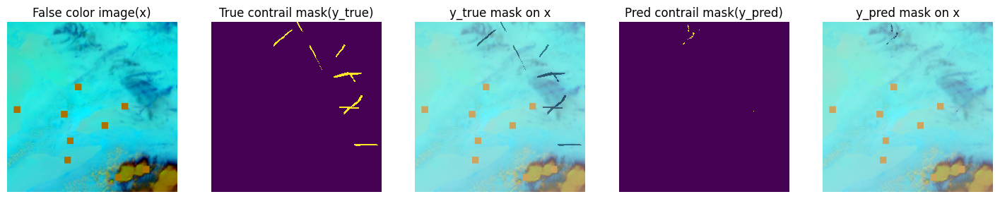

Val Batch:   116/116         | Loss: 0.001084:   8%|▊         | 2/25 [34:16<4:22:53, 685.82s/it]

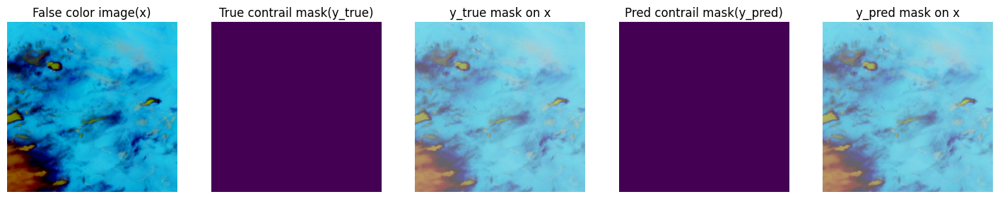

Val Batch:   116/116         | Loss: 0.001084:  12%|█▏        | 3/25 [34:17<4:10:43, 683.82s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.004713         | Val = 0.002123
Dice: Train = 0.215963         | Val = 0.113934

EPOCH: 4/25
Epoch: 4, Learning rate: 0.009648882429441258


Train Batch: 1283/1283     | Loss: 0.005221:  12%|█▏        | 3/25 [44:39<4:10:43, 683.82s/it]

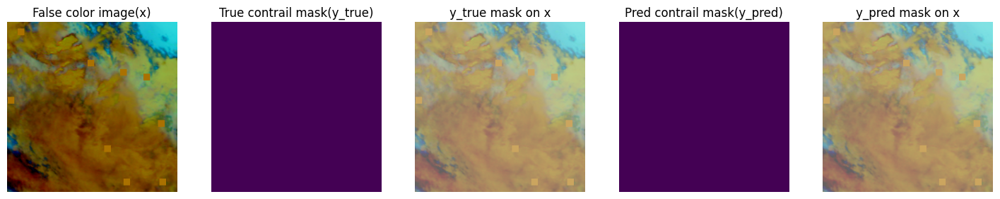

Val Batch:   116/116         | Loss: 0.002465:  12%|█▏        | 3/25 [45:25<4:10:43, 683.82s/it]

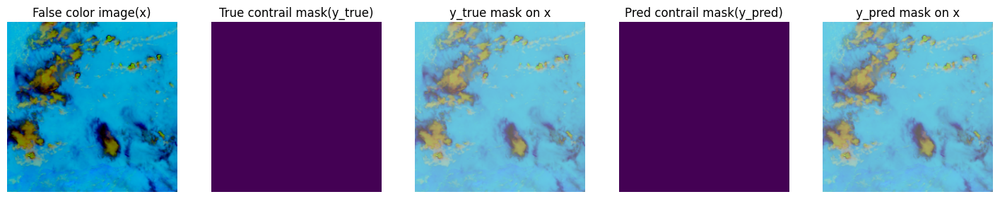

Val Batch:   116/116         | Loss: 0.002465:  16%|█▌        | 4/25 [45:26<3:57:20, 678.14s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.004343         | Val = 0.001937
Dice: Train = 0.276902         | Val = 0.196274

EPOCH: 5/25
Epoch: 5, Learning rate: 0.009381533400219319


Train Batch: 1283/1283     | Loss: 0.002818:  16%|█▌        | 4/25 [55:37<3:57:20, 678.14s/it]

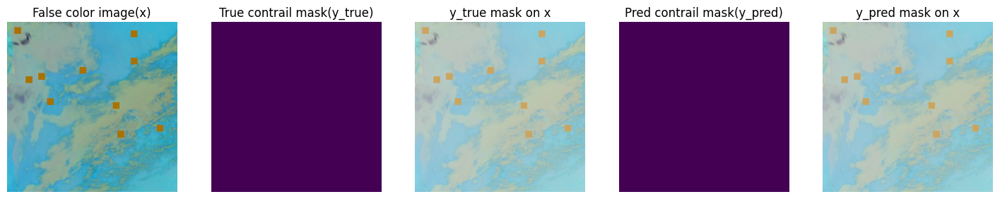

Val Batch:   116/116         | Loss: 0.001210:  16%|█▌        | 4/25 [56:22<3:57:20, 678.14s/it]

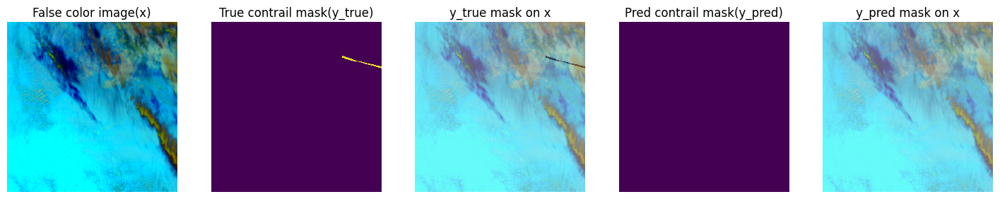

Val Batch:   116/116         | Loss: 0.001210:  20%|██        | 5/25 [56:23<3:43:27, 670.36s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.004145         | Val = 0.002191
Dice: Train = 0.305103         | Val = 0.108046

EPOCH: 6/25
Epoch: 6, Learning rate: 0.009045084971874739


Train Batch: 1283/1283     | Loss: 0.004888:  20%|██        | 5/25 [1:06:21<3:43:27, 670.36s/it]

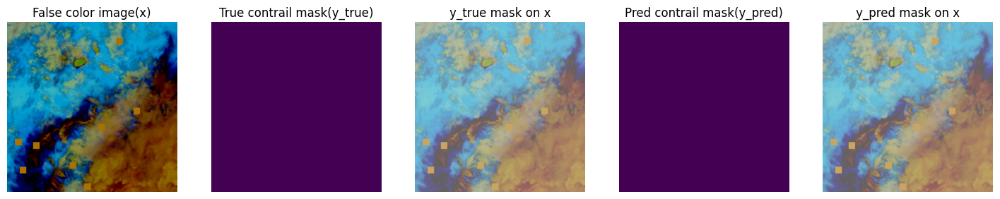

Val Batch:   116/116         | Loss: 0.000506:  20%|██        | 5/25 [1:07:06<3:43:27, 670.36s/it]

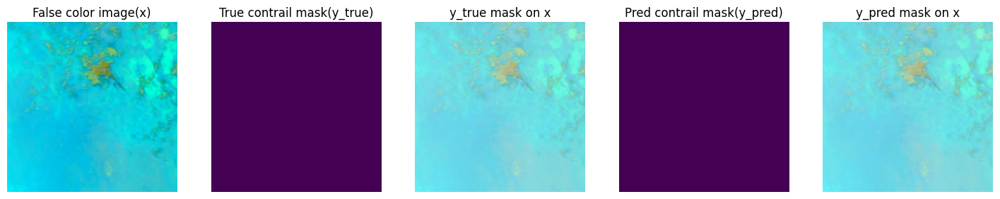

Val Batch:   116/116         | Loss: 0.000506:  24%|██▍       | 6/25 [1:07:07<3:29:27, 661.44s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.003921         | Val = 0.001661
Dice: Train = 0.340718         | Val = 0.230419

EPOCH: 7/25
Epoch: 7, Learning rate: 0.00864484313710706


Train Batch: 1283/1283     | Loss: 0.003461:  24%|██▍       | 6/25 [1:19:12<3:29:27, 661.44s/it]

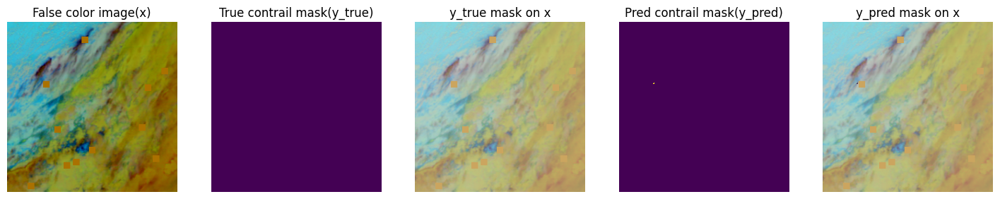

Val Batch:   116/116         | Loss: 0.004774:  24%|██▍       | 6/25 [1:20:00<3:29:27, 661.44s/it]

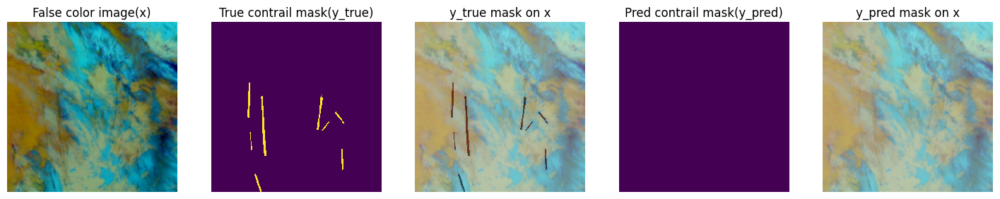

Val Batch:   116/116         | Loss: 0.004774:  28%|██▊       | 7/25 [1:20:01<3:29:26, 698.16s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.003830         | Val = 0.001835
Dice: Train = 0.347435         | Val = 0.187983

EPOCH: 8/25
Epoch: 8, Learning rate: 0.00818711994874345


Train Batch: 1283/1283     | Loss: 0.002133:  28%|██▊       | 7/25 [1:30:23<3:29:26, 698.16s/it]

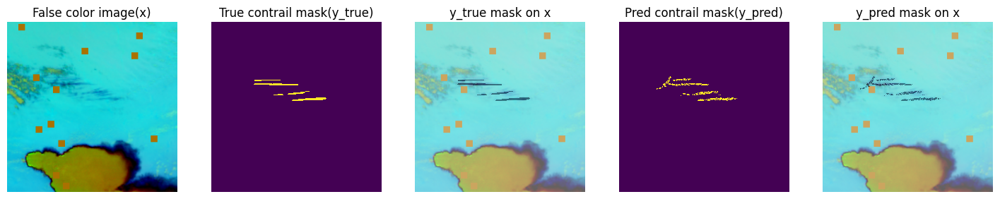

Val Batch:   116/116         | Loss: 0.000918:  28%|██▊       | 7/25 [1:31:10<3:29:26, 698.16s/it]

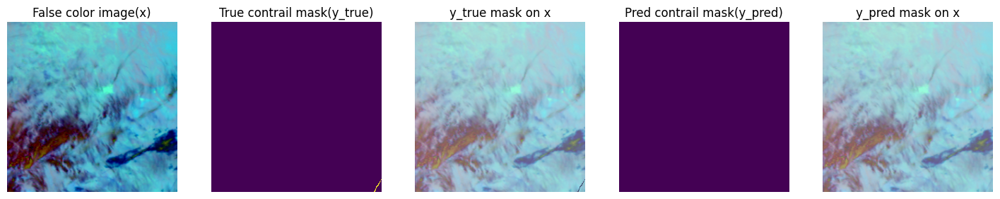

Val Batch:   116/116         | Loss: 0.000918:  32%|███▏      | 8/25 [1:31:11<3:15:17, 689.29s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.003686         | Val = 0.001677
Dice: Train = 0.371035         | Val = 0.243335

EPOCH: 9/25
Epoch: 9, Learning rate: 0.007679133974894984


Train Batch: 1283/1283     | Loss: 0.003880:  32%|███▏      | 8/25 [1:41:28<3:15:17, 689.29s/it]

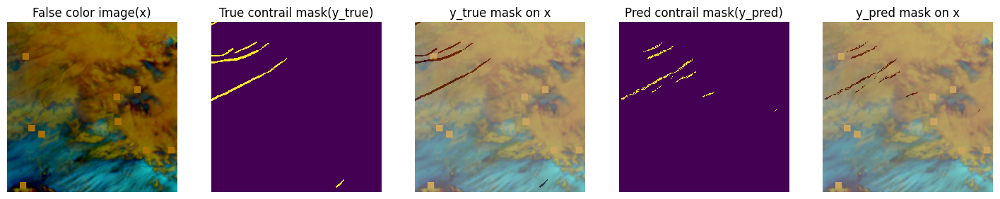

Val Batch:   116/116         | Loss: 0.001603:  32%|███▏      | 8/25 [1:42:15<3:15:17, 689.29s/it]

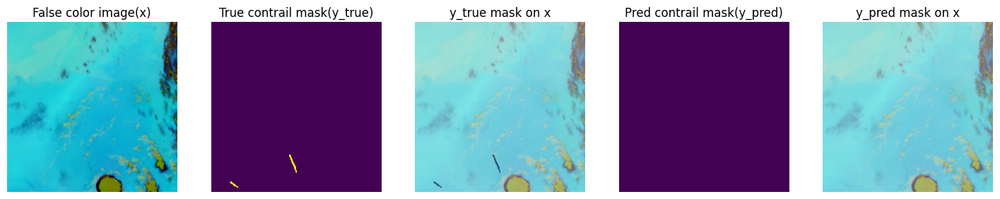

Val Batch:   116/116         | Loss: 0.001603:  36%|███▌      | 9/25 [1:42:16<3:01:47, 681.72s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.003615         | Val = 0.001632
Dice: Train = 0.377366         | Val = 0.275785

EPOCH: 10/25
Epoch: 10, Learning rate: 0.007128896457825364


Train Batch: 1283/1283     | Loss: 0.002138:  36%|███▌      | 9/25 [1:52:40<3:01:47, 681.72s/it]

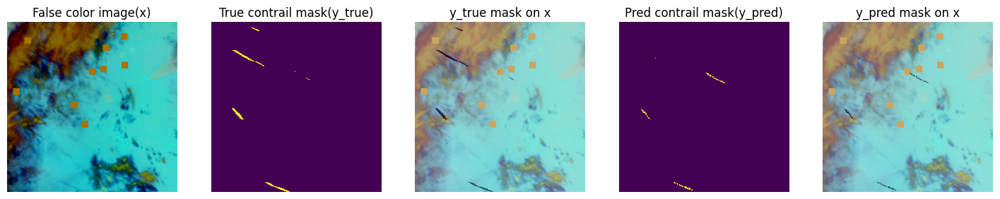

Val Batch:   116/116         | Loss: 0.003025:  36%|███▌      | 9/25 [1:53:29<3:01:47, 681.72s/it]

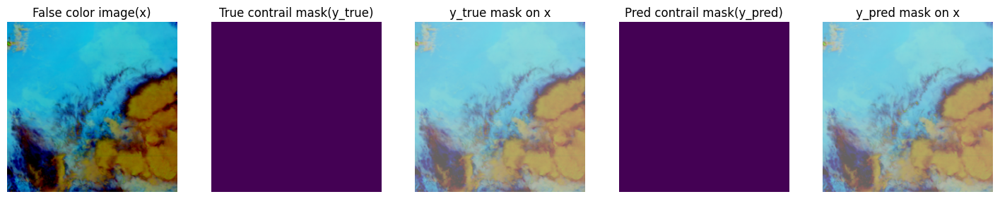

Val Batch:   116/116         | Loss: 0.003025:  40%|████      | 10/25 [1:53:31<2:49:52, 679.50s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.003489         | Val = 0.001721
Dice: Train = 0.391599         | Val = nan

EPOCH: 11/25
Epoch: 11, Learning rate: 0.006545084971874737


Train Batch: 1283/1283     | Loss: 0.004289:  40%|████      | 10/25 [2:04:02<2:49:52, 679.50s/it]

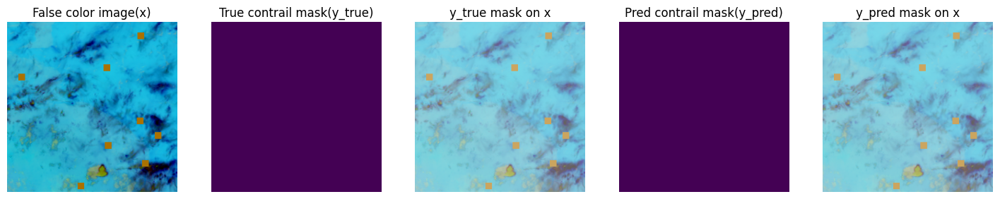

Val Batch:   116/116         | Loss: 0.001380:  40%|████      | 10/25 [2:04:50<2:49:52, 679.50s/it]

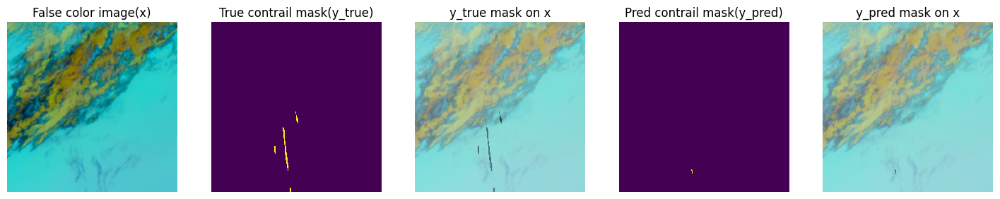

Val Batch:   116/116         | Loss: 0.001380:  44%|████▍     | 11/25 [2:04:51<2:38:36, 679.77s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.003434         | Val = 0.001533
Dice: Train = 0.396787         | Val = 0.337691

EPOCH: 12/25
Epoch: 12, Learning rate: 0.005936906572928624


Train Batch: 1283/1283     | Loss: 0.005381:  44%|████▍     | 11/25 [2:15:23<2:38:36, 679.77s/it]

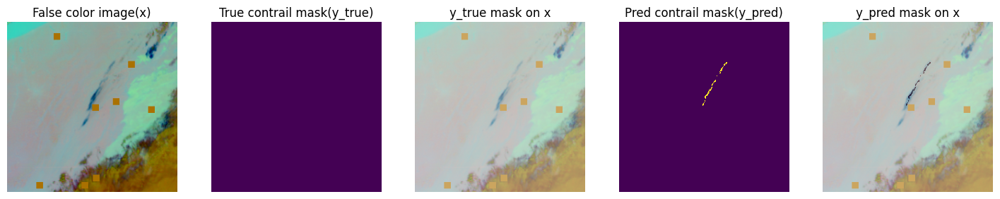

Val Batch:   116/116         | Loss: 0.001535:  44%|████▍     | 11/25 [2:16:14<2:38:36, 679.77s/it]

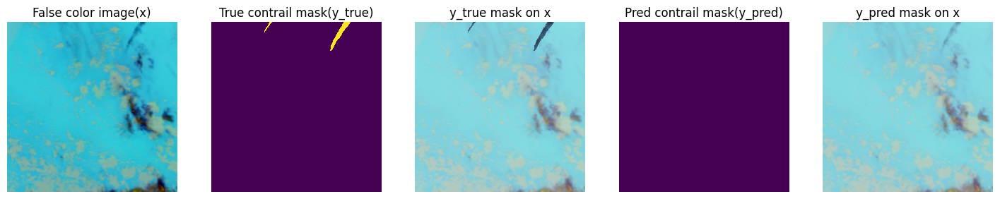

Val Batch:   116/116         | Loss: 0.001535:  48%|████▊     | 12/25 [2:16:14<2:27:31, 680.86s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.003322         | Val = 0.001504
Dice: Train = 0.406185         | Val = nan

EPOCH: 13/25
Epoch: 13, Learning rate: 0.005313952597646568


Train Batch: 1283/1283     | Loss: 0.002966:  48%|████▊     | 12/25 [2:26:40<2:27:31, 680.86s/it]

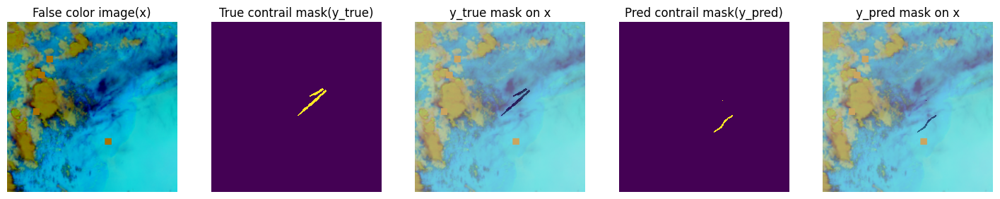

Val Batch:   116/116         | Loss: 0.000968:  48%|████▊     | 12/25 [2:27:27<2:27:31, 680.86s/it]

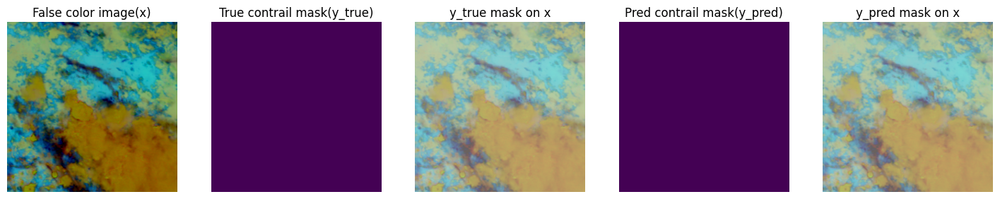

Val Batch:   116/116         | Loss: 0.000968:  52%|█████▏    | 13/25 [2:27:27<2:15:42, 678.51s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.003248         | Val = 0.001427
Dice: Train = 0.478950         | Val = nan

EPOCH: 14/25
Epoch: 14, Learning rate: 0.004686047402353434


Train Batch: 1283/1283     | Loss: 0.002213:  52%|█████▏    | 13/25 [2:37:59<2:15:42, 678.51s/it]

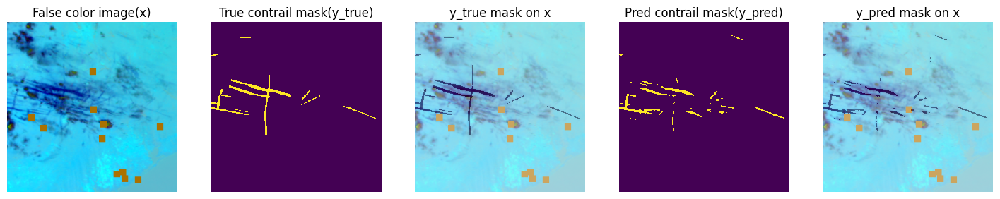

Val Batch:   116/116         | Loss: 0.001883:  52%|█████▏    | 13/25 [2:38:49<2:15:42, 678.51s/it]

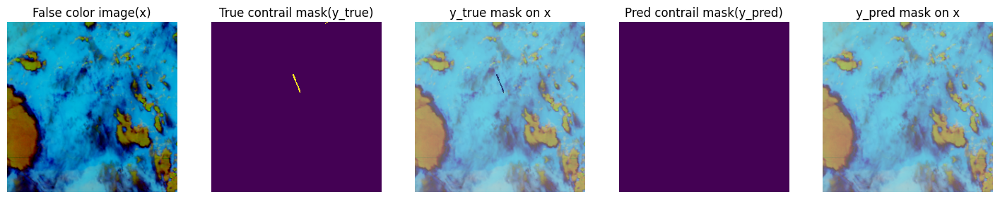

Val Batch:   116/116         | Loss: 0.001883:  56%|█████▌    | 14/25 [2:38:49<2:04:35, 679.55s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.003201         | Val = 0.001577
Dice: Train = 0.507761         | Val = nan

EPOCH: 15/25
Epoch: 15, Learning rate: 0.004063093427071378


Train Batch: 1283/1283     | Loss: 0.001390:  56%|█████▌    | 14/25 [2:49:19<2:04:35, 679.55s/it]

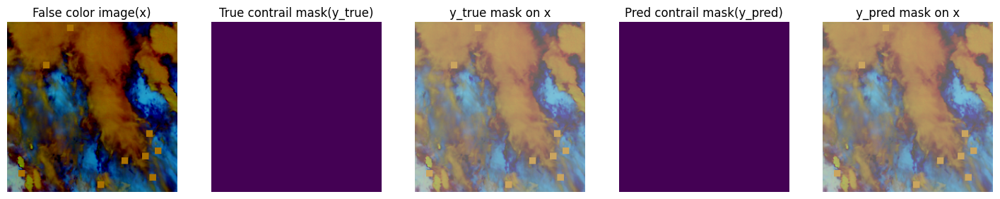

Val Batch:   116/116         | Loss: 0.000785:  56%|█████▌    | 14/25 [2:50:06<2:04:35, 679.55s/it]

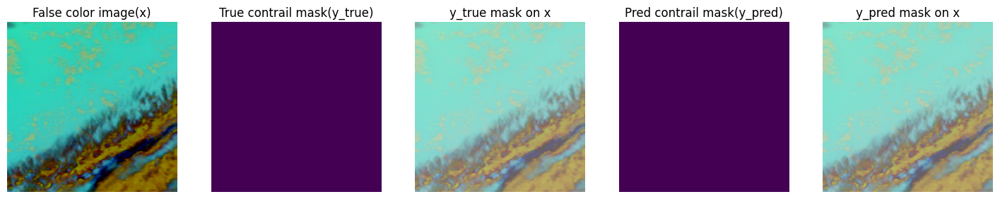

Val Batch:   116/116         | Loss: 0.000785:  60%|██████    | 15/25 [2:50:07<1:53:09, 678.98s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.003140         | Val = 0.001303
Dice: Train = 0.519514         | Val = 0.418337

EPOCH: 16/25
Epoch: 16, Learning rate: 0.003454915028125265


Train Batch: 1283/1283     | Loss: 0.003596:  60%|██████    | 15/25 [3:00:25<1:53:09, 678.98s/it]

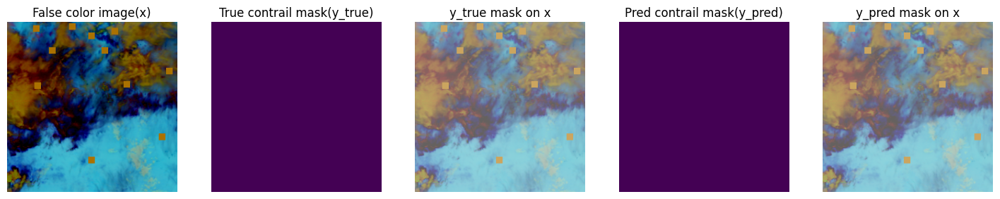

Val Batch:   116/116         | Loss: 0.000713:  60%|██████    | 15/25 [3:01:13<1:53:09, 678.98s/it]

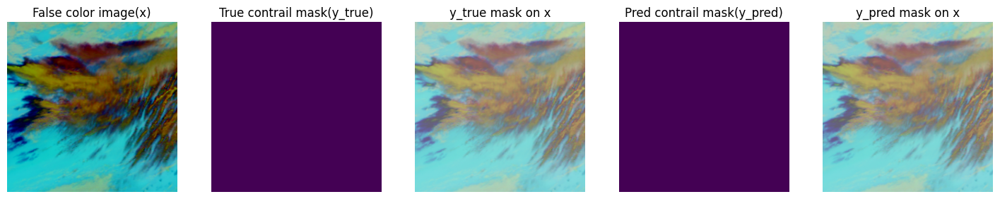

Val Batch:   116/116         | Loss: 0.000713:  64%|██████▍   | 16/25 [3:01:13<1:41:16, 675.20s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.003067         | Val = 0.001563
Dice: Train = 0.526515         | Val = nan

EPOCH: 17/25
Epoch: 17, Learning rate: 0.002871103542174637


Train Batch: 1283/1283     | Loss: 0.002965:  64%|██████▍   | 16/25 [3:11:36<1:41:16, 675.20s/it]

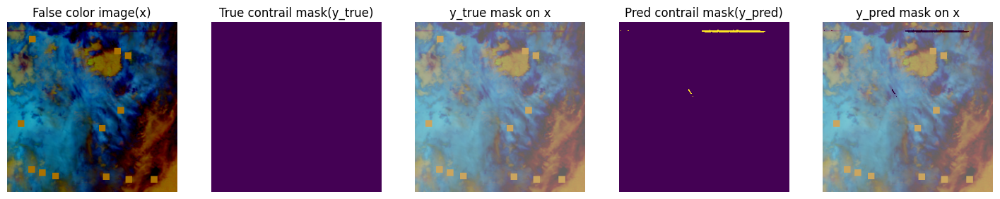

Val Batch:   116/116         | Loss: 0.001120:  64%|██████▍   | 16/25 [3:12:24<1:41:16, 675.20s/it]

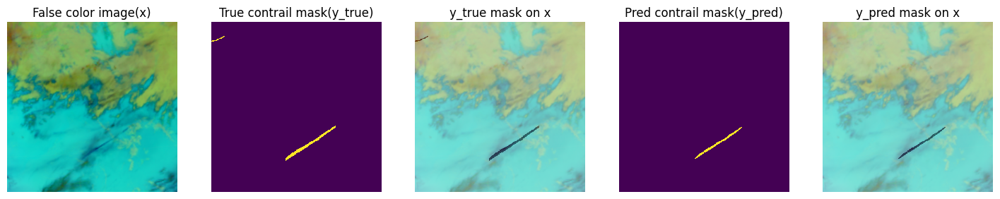

Val Batch:   116/116         | Loss: 0.001120:  68%|██████▊   | 17/25 [3:12:25<1:29:52, 674.10s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.003031         | Val = 0.001462
Dice: Train = 0.533596         | Val = 0.359512

EPOCH: 18/25
Epoch: 18, Learning rate: 0.0023208660251050157


Train Batch: 1283/1283     | Loss: 0.005459:  68%|██████▊   | 17/25 [3:23:00<1:29:52, 674.10s/it]

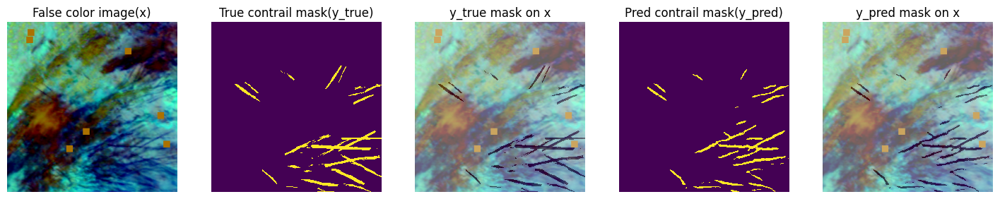

Val Batch:   116/116         | Loss: 0.000176:  68%|██████▊   | 17/25 [3:23:48<1:29:52, 674.10s/it]

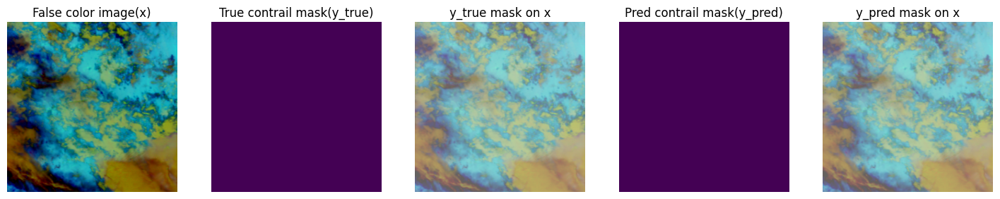

Val Batch:   116/116         | Loss: 0.000176:  72%|███████▏  | 18/25 [3:23:48<1:18:57, 676.83s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.002985         | Val = 0.001464
Dice: Train = 0.538965         | Val = 0.395170

EPOCH: 19/25
Epoch: 19, Learning rate: 0.0018128800512565513


Train Batch: 1283/1283     | Loss: 0.001495:  72%|███████▏  | 18/25 [3:34:22<1:18:57, 676.83s/it]

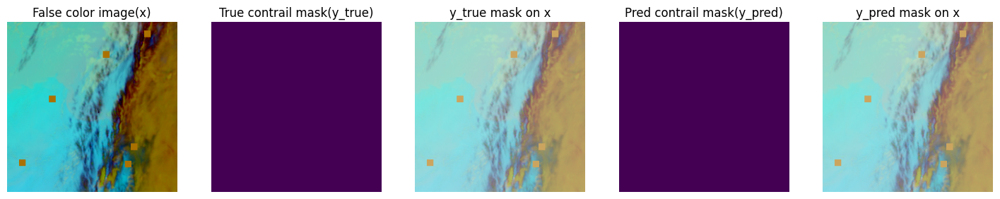

Val Batch:   116/116         | Loss: 0.002499:  72%|███████▏  | 18/25 [3:35:09<1:18:57, 676.83s/it]

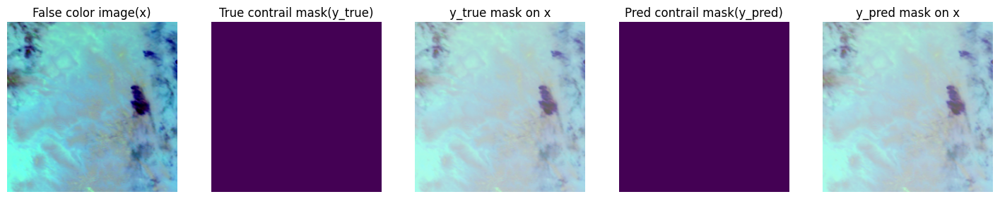

Val Batch:   116/116         | Loss: 0.002499:  76%|███████▌  | 19/25 [3:35:10<1:07:50, 678.34s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.002948         | Val = 0.001432
Dice: Train = 0.545348         | Val = 0.370103

EPOCH: 20/25
Epoch: 20, Learning rate: 0.0013551568628929435


Train Batch: 1283/1283     | Loss: 0.003388:  76%|███████▌  | 19/25 [3:45:39<1:07:50, 678.34s/it]

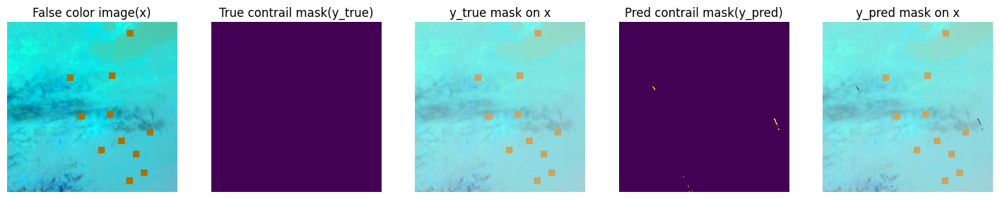

Val Batch:   116/116         | Loss: 0.000206:  76%|███████▌  | 19/25 [3:46:25<1:07:50, 678.34s/it]

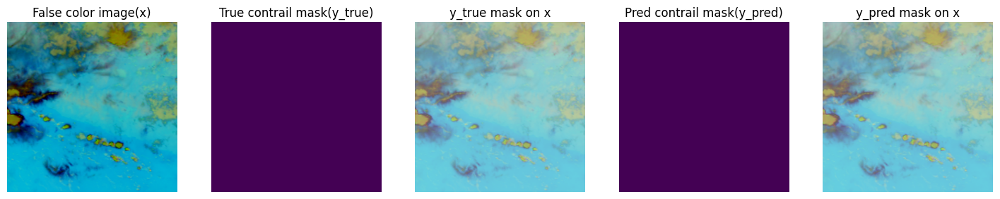

Val Batch:   116/116         | Loss: 0.000206:  80%|████████  | 20/25 [3:46:26<56:27, 677.56s/it]  

Train sample(above), Val sample(below)
Loss: Train = 0.002901         | Val = 0.001388
Dice: Train = 0.551329         | Val = 0.414657

EPOCH: 21/25
Epoch: 21, Learning rate: 0.0009549150281252634


Train Batch: 1283/1283     | Loss: 0.005172:  80%|████████  | 20/25 [3:56:57<56:27, 677.56s/it]

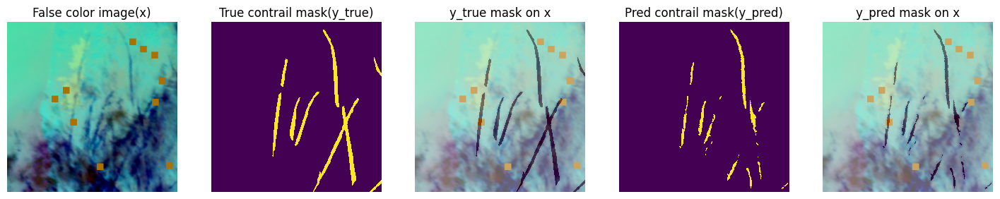

Val Batch:   116/116         | Loss: 0.000166:  80%|████████  | 20/25 [3:57:48<56:27, 677.56s/it]

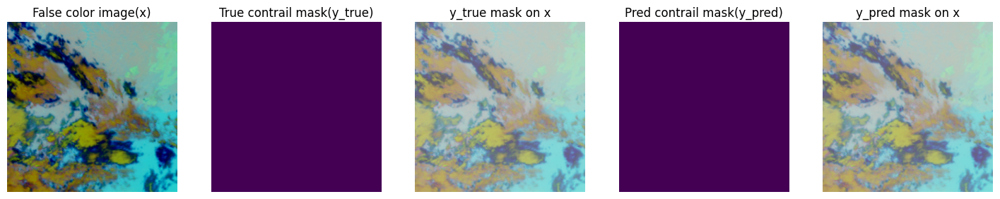

Val Batch:   116/116         | Loss: 0.000166:  84%|████████▍ | 21/25 [3:57:49<45:16, 679.24s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.002862         | Val = 0.001366
Dice: Train = 0.556042         | Val = 0.409698

EPOCH: 22/25
Epoch: 22, Learning rate: 0.0006184665997806822


Train Batch: 1283/1283     | Loss: 0.001903:  84%|████████▍ | 21/25 [4:08:19<45:16, 679.24s/it]

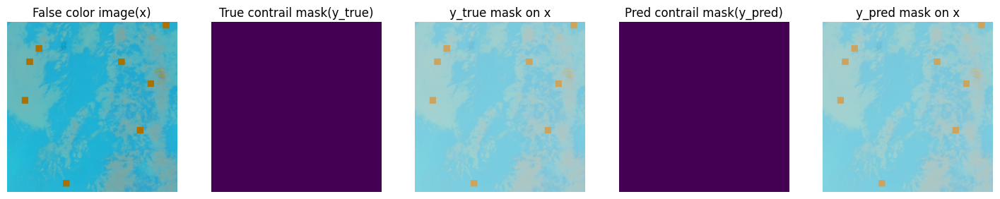

Val Batch:   116/116         | Loss: 0.000660:  84%|████████▍ | 21/25 [4:09:08<45:16, 679.24s/it]

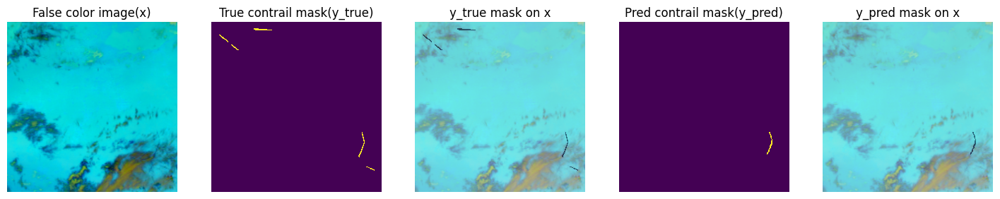

Val Batch:   116/116         | Loss: 0.000660:  88%|████████▊ | 22/25 [4:09:09<33:58, 679.45s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.002846         | Val = 0.001361
Dice: Train = 0.558873         | Val = nan

EPOCH: 23/25
Epoch: 23, Learning rate: 0.0003511175705587433


Train Batch: 1283/1283     | Loss: 0.003612:  88%|████████▊ | 22/25 [4:19:46<33:58, 679.45s/it]

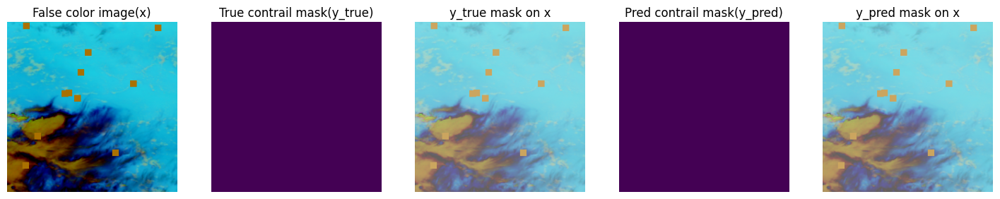

Val Batch:   116/116         | Loss: 0.000465:  88%|████████▊ | 22/25 [4:20:33<33:58, 679.45s/it]

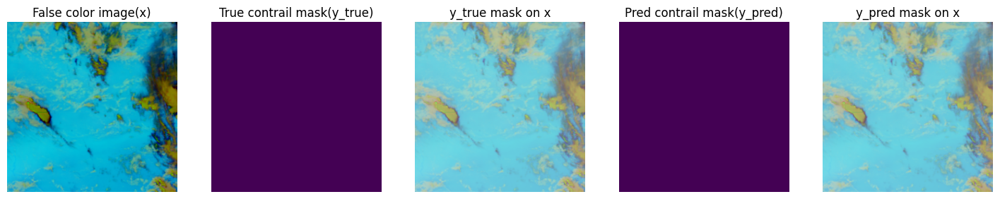

Val Batch:   116/116         | Loss: 0.000465:  92%|█████████▏| 23/25 [4:20:34<22:41, 680.99s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.002822         | Val = 0.001361
Dice: Train = 0.561717         | Val = nan

EPOCH: 24/25
Epoch: 24, Learning rate: 0.00015708419435684517


Train Batch: 1283/1283     | Loss: 0.002482:  92%|█████████▏| 23/25 [4:31:02<22:41, 680.99s/it]

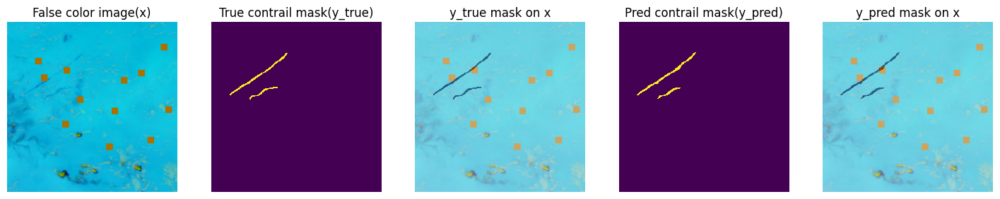

Val Batch:   116/116         | Loss: 0.000221:  92%|█████████▏| 23/25 [4:31:49<22:41, 680.99s/it]

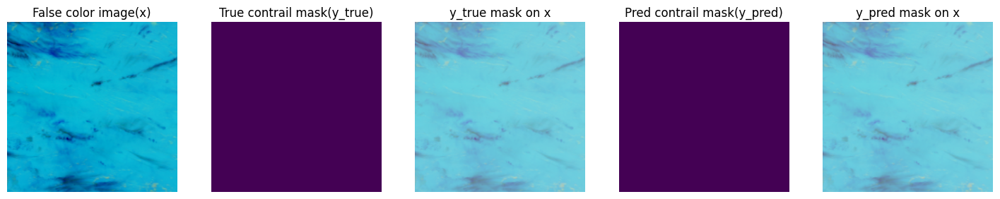

Val Batch:   116/116         | Loss: 0.000221:  96%|█████████▌| 24/25 [4:31:50<11:19, 679.49s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.002807         | Val = 0.001350
Dice: Train = 0.563362         | Val = 0.426457

EPOCH: 25/25
Epoch: 25, Learning rate: 3.9426493427611173e-05


Train Batch: 1283/1283     | Loss: 0.003144:  96%|█████████▌| 24/25 [4:42:18<11:19, 679.49s/it]

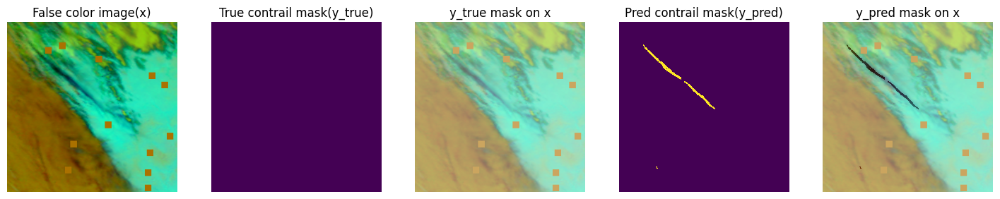

Val Batch:   116/116         | Loss: 0.001384:  96%|█████████▌| 24/25 [4:43:07<11:19, 679.49s/it]

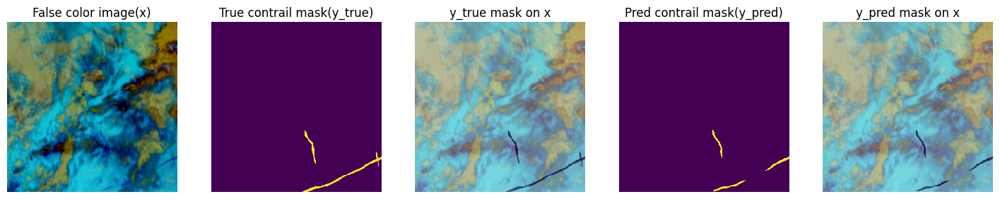

Val Batch:   116/116         | Loss: 0.001384: 100%|██████████| 25/25 [4:43:08<00:00, 679.54s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.002797         | Val = 0.001370
Dice: Train = 0.564226         | Val = 0.441167


In [17]:
pbar = tqdm(range(EPOCHS))

for epoch in pbar:
 print(f"\nEPOCH: {epoch+1}/{EPOCHS}")
 current_lr = optimizer.param_groups[0]['lr']
 print(f'Epoch: {epoch+1}, Learning rate: {current_lr}')
 model.train()
 for idx, (data, target) in enumerate(train_loader):
     data, target = data.to(DEVICE), target.to(DEVICE) #Copy to GPU if available
     y_pred = model(data)
     loss = loss_fn(y_pred, target)
     optimizer.zero_grad()
     loss.backward()
     optimizer.step()

     loss_tracker.on_train_batch_end(loss.item())
     dice_tracker.on_train_batch_end(dice_coeff(y_pred>0.5, target))
     pbar.set_description(f"Train Batch: {idx+1}/{len(train_loader)}\
     | Loss: {loss.item():.6f}")

 plot_contrail_comparision(data[0].cpu().detach(),
                           target[0].cpu().detach(),
                           y_pred[0].cpu().detach()>0.5)
 model.eval()    
 with torch.no_grad():
     for idx, (data, target) in enumerate(val_loader):
         data, target = data.to(DEVICE), target.to(DEVICE) #Copy to GPU if available
         y_pred = model(data)
         loss = loss_fn(y_pred, target)
         loss_tracker.on_val_batch_end(loss.item())
         dice_tracker.on_val_batch_end(dice_coeff(y_pred>0.5, target))
         pbar.set_description(f"Val Batch:   {idx+1}/{len(val_loader)}\
         | Loss: {loss.item():.6f}")

     plot_contrail_comparision(data[0].cpu().detach(),
                               target[0].cpu().detach(),
                               y_pred[0].cpu().detach()>0.5)
 print("Train sample(above), Val sample(below)")
 #scheduler.step(loss.item())
 scheduler.step()
 loss_tracker.on_epoch_end()
 dice_tracker.on_epoch_end()
 save_state.on_epoch_end()

save_state.on_end()
loss_tracker.on_end()
dice_tracker.on_end()

In [18]:
#torch.save(model.state_dict(),os.path.join(os.path.join(os.getcwd(),"saved_states"),f"bestmodel_state.pt"))

In [19]:
# Load pretrained states:
'''model.load_state_dict(torch.load("/kaggle/input/unet-trained-weights-contrails/contrails_save_states/saved_states/model_state_2023-05-12_06_31_20.pt",map_location=torch.device(DEVICE)))
optimizer.load_state_dict(torch.load("/kaggle/input/unet-trained-weights-contrails/contrails_save_states/saved_states/optim_state_2023-05-12_06_31_20.pt",map_location=torch.device(DEVICE)))
loss_tracker.train_batch_history=np.load("/kaggle/input/unet-trained-weights-contrails/contrails_save_states/saved_states/Loss/train_batch.npy")
loss_tracker.train_epoch_history=np.load("/kaggle/input/unet-trained-weights-contrails/contrails_save_states/saved_states/Loss/train_epoch.npy")
loss_tracker.val_batch_histroy=np.load("/kaggle/input/unet-trained-weights-contrails/contrails_save_states/saved_states/Loss/val_batch.npy")
loss_tracker.val_epoch_history=np.load("/kaggle/input/unet-trained-weights-contrails/contrails_save_states/saved_states/Loss/val_epoch.npy")
dice_tracker.train_batch_history=np.load("/kaggle/input/unet-trained-weights-contrails/contrails_save_states/saved_states/Dice/train_batch.npy")
dice_tracker.train_epoch_history=np.load("/kaggle/input/unet-trained-weights-contrails/contrails_save_states/saved_states/Dice/train_epoch.npy")
dice_tracker.val_batch_histroy=np.load("/kaggle/input/unet-trained-weights-contrails/contrails_save_states/saved_states/Dice/val_batch.npy")
dice_tracker.val_epoch_history=np.load("/kaggle/input/unet-trained-weights-contrails/contrails_save_states/saved_states/Dice/val_epoch.npy")'''


'model.load_state_dict(torch.load("/kaggle/input/unet-trained-weights-contrails/contrails_save_states/saved_states/model_state_2023-05-12_06_31_20.pt",map_location=torch.device(DEVICE)))\noptimizer.load_state_dict(torch.load("/kaggle/input/unet-trained-weights-contrails/contrails_save_states/saved_states/optim_state_2023-05-12_06_31_20.pt",map_location=torch.device(DEVICE)))\nloss_tracker.train_batch_history=np.load("/kaggle/input/unet-trained-weights-contrails/contrails_save_states/saved_states/Loss/train_batch.npy")\nloss_tracker.train_epoch_history=np.load("/kaggle/input/unet-trained-weights-contrails/contrails_save_states/saved_states/Loss/train_epoch.npy")\nloss_tracker.val_batch_histroy=np.load("/kaggle/input/unet-trained-weights-contrails/contrails_save_states/saved_states/Loss/val_batch.npy")\nloss_tracker.val_epoch_history=np.load("/kaggle/input/unet-trained-weights-contrails/contrails_save_states/saved_states/Loss/val_epoch.npy")\ndice_tracker.train_batch_history=np.load("/ka

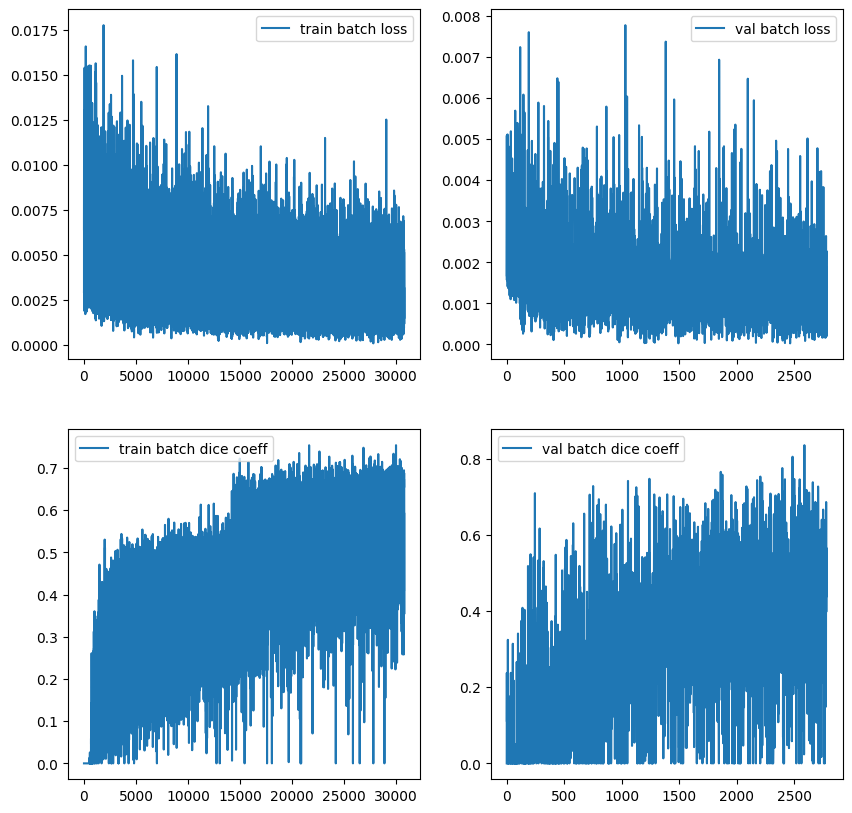

In [20]:
plt.figure(figsize=(10,10))
ax = plt.subplot(2,2,1)
ax.plot(loss_tracker.train_batch_history[len(train_loader):], label="train batch loss")
ax.legend()
ax = plt.subplot(2,2,2)
ax.plot(loss_tracker.val_batch_histroy[len(val_loader):], label="val batch loss")
ax.legend()
ax = plt.subplot(2,2,3)
ax.plot(dice_tracker.train_batch_history[len(train_loader):], label="train batch dice coeff")
ax.legend()
ax = plt.subplot(2,2,4)
ax.plot(dice_tracker.val_batch_histroy[len(val_loader):], label="val batch dice coeff")
ax.legend()
plt.show()

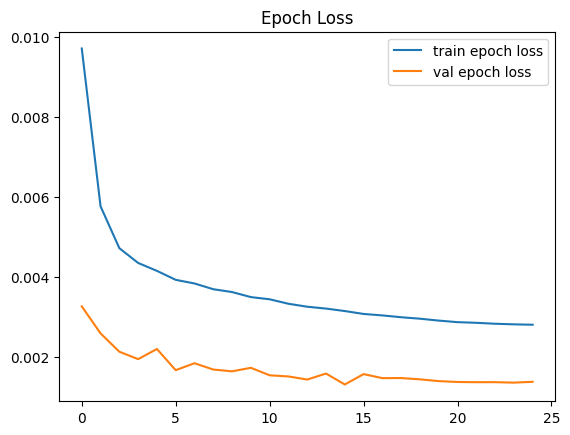

In [21]:
plt.plot(loss_tracker.train_epoch_history, label="train epoch loss")
plt.plot(loss_tracker.val_epoch_history, label="val epoch loss")
plt.legend()
plt.title("Epoch Loss")
plt.show()

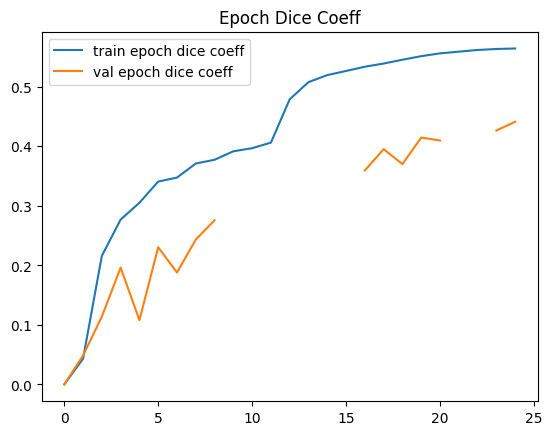

In [22]:
plt.plot(dice_tracker.train_epoch_history, label="train epoch dice coeff")
plt.plot(dice_tracker.val_epoch_history, label="val epoch dice coeff")
plt.legend()
plt.title("Epoch Dice Coeff")
plt.show()